(lagham_tut)=

# Lagrangian and Hamiltonian mechanics

```{versionadded} 4.0.0

```

heyoka.py offers direct support for Lagrangian and Hamiltonian mechanics. This means that you can supply heyoka.py a Lagrangian or Hamiltonian, and heyoka.py will take care of formulating the equations of motion for you.

Let us explore this feature with a couple of simple examples.

## Pendulum on a movable support

Consider the motion of a simple pendulum attached to a massive support that can freely move horizontally:

<img src="movable_pendulum.svg" width="600">

(credits to [Wikipedia](https://en.wikipedia.org/wiki/Lagrangian_mechanics) for the image)

We can choose $x$ and $\theta$ as the generalised coordinates for this system. Let us introduce a few initial quantities:

In [1]:
import heyoka as hy

# Generalised coordinates.
x, th = hy.make_vars("x", "theta")

# Generalised velocities.
vx, vth = hy.make_vars("vx", "vtheta")

# System parameters.
M = hy.par[0]
m = hy.par[1]
l = hy.par[2]
g = hy.par[3]

The masses $M$ and $m$, the pendulum length $l$ and the gravitational acceleration $g$ have all been introduced as [runtime parameters](<./ODEs with parameters.ipynb>).

The Cartesian position of the pendulum's bob in terms of the generalised coordinates can be written as:

$$
    \begin{cases}
      x_{\mathrm{pend}} & = x + l\sin\left( \theta \right)\\
      y_{\mathrm{pend}} & = -l\cos\left( \theta \right)
    \end{cases}\,.
$$

In order to compute the kinetic energy of the system, we must first compute the cartesian velocity of the bob as a function of the generalised coordinates and velocities. We do not have to do this by hand, rather we can let heyoka.py's symbolic differentiation capabilities do the work for us (see the tutorial on [computing derivatives](<./computing_derivatives.ipynb>)):

In [2]:
import numpy as np

# Cartesian coordinates of the bob.
xpend = x + l * hy.sin(th)
ypend = -l * hy.cos(th)

# Cartesian velocities of the bob.
vxpend, vypend = hy.diff_tensors([xpend, ypend], diff_args=[x, th]).jacobian @ [vx, vth]

We can now formulate the kinetic energy, which reads:

$$
T = \frac{1}{2}M\dot{x}^2 + \frac{1}{2}m\left( \dot{x}_\mathrm{pend}^2 + \dot{y}_\mathrm{pend}^2 \right).
$$

In [3]:
T = 0.5 * M * vx**2 + 0.5 * m * (vxpend**2 + vypend**2)

The gravitational potential of the bob instead reads:

$$
V=mgy_\mathrm{pend}.
$$

In [4]:
V = m * g * ypend

We can now assemble the Lagrangian $L = T - V$:

In [5]:
L = T - V

The equations of motion can now be formulated via the {func}`~heyoka.lagrangian()` function. This function takes 3 mandatory arguments in input:

- the Lagrangian,
- the list of generalised coordinates,
- the list of generalised velocities.

{func}`~heyoka.lagrangian()` will return a list of differential equations that can be directly used to create a {func}`~heyoka.taylor_adaptive` integrator.

In [6]:
# Generate the system of differential equations.
sys = hy.lagrangian(L, [x, th], [vx, vth])

We can now assign values to the parameters of the system, and create an integrator object:

In [7]:
# Parameter values.
Mval, mval, lval, gval = [1.0, 0.1, 0.7, 0.8]

# Integrator object.
ta = hy.taylor_adaptive(sys, [0.0, 0.3, 0.0, 0.0], pars=[Mval, mval, lval, gval])

Let us numerically integrate the system for a few time units:

In [8]:
res = ta.propagate_grid(np.linspace(0, 50, 200))

We are now ready to produce a nice animation:

In [9]:
%%capture
%matplotlib inline

import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

hist = res[-1]

fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(111)

# Init the graphical elements.
pend = plt.Circle((0.2, 0.0), 0.03, ec="black", fc="black", zorder=3)
supp_width = 0.4
supp = plt.Rectangle((0.1, 0.0), supp_width, 0.2)
(ln_pend,) = ax.plot([], [], "k--")
y_axis = plt.hlines(0, -2, 2, colors="gray", linewidths=4.0)

ax.add_artist(pend)
ax.add_artist(supp)


def init():
    ax.set_xlim((-0.4, 0.4))
    ax.set_ylim((-0.8, 0.4))
    ax.set_aspect("equal")
    return (pend, supp)


def animate(i):
    cur_x, cur_th = hist[i][0:2]
    pend_x, pend_y = cur_x + lval * np.sin(cur_th), -lval * np.cos(cur_th)
    supp_x = cur_x - supp_width / 2

    pend.set_center((pend_x, pend_y))

    supp.set_xy((supp_x, 0.0))

    ln_pend.set_data([pend_x, cur_x], [pend_y, 0.0])

    return (pend, supp)


anim = HTML(
    animation.FuncAnimation(
        fig, animate, init_func=init, frames=200, interval=50, blit=True
    ).to_jshtml()
)

In [10]:
anim

### Adding a friction term

The {func}`~heyoka.lagrangian()` function takes as an optional additional argument a [Rayleigh dissipation function](https://en.wikipedia.org/wiki/Rayleigh_dissipation_function) that can be used to implement linear dissipative forces when formulating the Euler-Lagrange equations.
The dissipation function $D$ must be a quadratic form of the velocities, and it results in the term $\frac{\partial D}{\partial \dot{q}_i}$ begin added to the Euler-Lagrange equations. In our specific case, we use the dissipation function $D=\dot{x}^2$ to introduce
a linear friction term in the motion of the massive support:

In [11]:
# Dynamics with dissipation.
sys = hy.lagrangian(L, [x, th], [vx, vth], vx**2)

Let us again integrate the dissipative system and produce a nice animation:

In [12]:
ta = hy.taylor_adaptive(sys, [0.0, 0.3, 0.0, 0.0], pars=[Mval, mval, lval, gval])

res = ta.propagate_grid(np.linspace(0, 75, 200))

In [13]:
%%capture

hist = res[-1]

fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(111)

# Init the graphical elements.
pend = plt.Circle((0.2, 0.0), 0.03, ec="black", fc="black", zorder=3)
supp_width = 0.4
supp = plt.Rectangle((0.1, 0.0), supp_width, 0.2)
(ln_pend,) = ax.plot([], [], "k--")
y_axis = plt.hlines(0, -2, 2, colors="gray", linewidths=4.0)

ax.add_artist(pend)
ax.add_artist(supp)


def init():
    ax.set_xlim((-0.4, 0.4))
    ax.set_ylim((-0.8, 0.4))
    ax.set_aspect("equal")
    return (pend, supp)


def animate(i):
    cur_x, cur_th = hist[i][0:2]
    pend_x, pend_y = cur_x + lval * np.sin(cur_th), -lval * np.cos(cur_th)
    supp_x = cur_x - supp_width / 2

    pend.set_center((pend_x, pend_y))

    supp.set_xy((supp_x, 0.0))

    ln_pend.set_data([pend_x, cur_x], [pend_y, 0.0])

    return (pend, supp)


anim = HTML(
    animation.FuncAnimation(
        fig, animate, init_func=init, frames=200, interval=50, blit=True
    ).to_jshtml()
)

In [14]:
anim

We can clearly see the effect of the dissipative term on the motion of both the support and the pendulum's bob.

## The spherical pendulum

As a simple Hamiltonian mechanics example, consider the motion of a spherical pendulum:

<img src="spherical_pendulum.svg" width="600">

(credits to [Wikipedia](https://en.wikipedia.org/wiki/Hamiltonian_mechanics) for the image)

The angles $\theta$ and $\phi$ can be chosen as the generalised coordinates. The Hamiltonian for this system can be written as:

$$
H = \frac{P_\theta^2}{2m\ell^2} + \frac{P_\varphi^2}{2m\ell^2\sin^2\theta} - mg\ell\cos\theta,
$$

where the generalised momenta are defined as

$$
    \begin{cases}
      P_\theta &= m\ell^2\dot \theta\\
      P_\varphi &= m\ell^2\sin^2 \!\theta \, \dot \varphi
    \end{cases}\,.
$$

Let us introduce a few symbolic quantities to represent the variables and parameters of this system:

In [15]:
# Generalised coordinates.
th, phi = hy.make_vars("theta", "phi")

# Generalised momenta.
Pth, Pphi = hy.make_vars("Ptheta", "Pphi")

# System parameters.
m = hy.par[0]
l = hy.par[1]
g = hy.par[2]

And let us define the Hamiltonian:

In [16]:
H = (
    Pth**2 / (2.0 * m * l**2)
    + Pphi**2 / (2.0 * m * l**2 * hy.sin(th) ** 2)
    - m * g * l * hy.cos(th)
)

We can formulate the equations of motion via the {func}`~heyoka.hamiltonian()` function. Similarly to {func}`~heyoka.lagrangian()`, {func}`~heyoka.hamiltonian()` takes in input the Hamiltonian, the list of generalised coordinates and the list of generalised momenta, and it returns a system of differential equations that can be used directly in a numerical integration.

In [17]:
# Formulate the dynamical equations.
sys = hy.hamiltonian(H, [th, phi], [Pth, Pphi])

We can now proceed to numerically integrate the system for a few time units:

In [18]:
# Parameter values.
mval, lval, gval = [0.1, 0.7, 0.8]

# Integrator object.
ta = hy.taylor_adaptive(sys, [0.3, 0.4, 0.15, 0.12], pars=[mval, lval, gval])

# Run the numerical integration.
tgrid = np.linspace(0, 20, 500)
res = ta.propagate_grid(tgrid)

Let us see the time evolution of the angular coordinates:

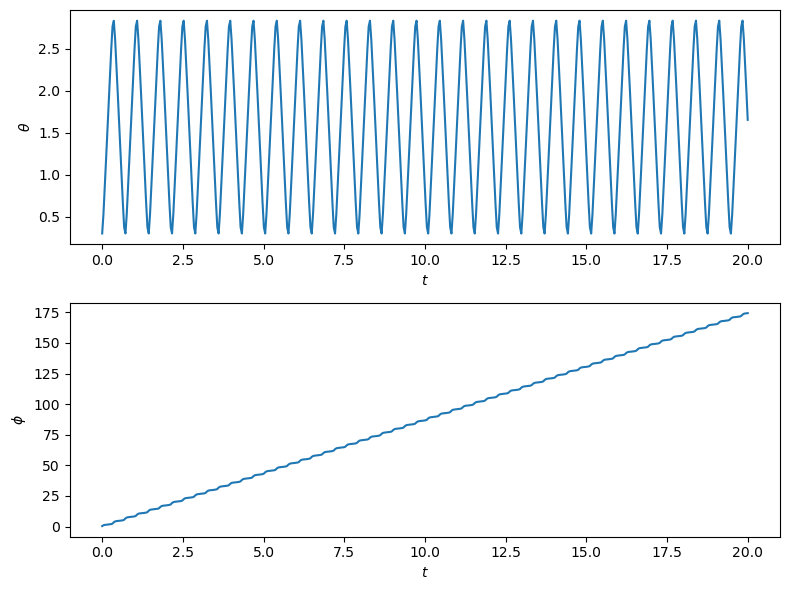

In [19]:
fig = plt.figure(figsize=(8, 6))

ax = plt.subplot(211)
ax.plot(tgrid, res[-1][:, 0])
ax.set_xlabel(r"$t$")
ax.set_ylabel(r"$\theta$")

ax = plt.subplot(212)
ax.plot(tgrid, res[-1][:, 1])
ax.set_xlabel(r"$t$")
ax.set_ylabel(r"$\phi$")

plt.tight_layout();